# **VGG-16 and ResNet101v2 Model single protien image classification and class saliency Map** 

Importing essential libraries

In [ ]:
# initiating gpu using tensorflow.
import tensorflow as tf
from tensorflow.compat.v1.keras.backend import set_session
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
config.log_device_placement = True
sess = tf.compat.v1.Session(config=config)
set_session(sess)

Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5



In [ ]:
# importing required libararies and packages
import numpy as np
import pandas as pd
import glob
import random 
import os
import cv2
from shutil import copy,copytree
import shutil

!pip install patchify
from patchify import patchify

from google.colab import files
import os
import zipfile

#visulaziation
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


# image
from PIL import Image

# sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
#tensorflow
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img,img_to_array
from tensorflow.keras.applications import VGG16, InceptionV3, ResNet101V2, Xception, ResNet50V2, VGG19
from tensorflow.keras import optimizers
from tensorflow.keras.optimizers import Adam
#from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras import models, layers
from keras.utils.vis_utils import plot_model
from tensorflow.keras.layers import Dense,Conv2D,MaxPool2D,Flatten,Dropout,BatchNormalization,Activation,GlobalAveragePooling2D

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

#setting seed to reproduce the same result every time the code is re-run
seed_num = 1
tf.random.set_seed(seed_num)
np.random.seed(seed_num)

# install split-folder
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Unziping the dataset**

In [ ]:
%%capture
!unzip /content/drive/MyDrive/Dataset.zip

#**Data Engineering**
**Renaming all the files in the subfolder for both control and patient with subfolder names**

In [ ]:
d = ["/content/Dataset/controls/C01","/content/Dataset/controls/C02","/content/Dataset/controls/C03","/content/Dataset/controls/C04"]
for i in d:
  for path in os.listdir(i):
      full_path = os.path.join(i, path)
      if os.path.isfile(full_path):
          new_path = os.path.join(i, "C0"+str(d.index(i)+1)+"_"+ path)
          os.rename(full_path, new_path)

In [ ]:
d = ["/content/Dataset/patients/P01","/content/Dataset/patients/P02","/content/Dataset/patients/P03","/content/Dataset/patients/P04","/content/Dataset/patients/P05","/content/Dataset/patients/P06","/content/Dataset/patients/P07","/content/Dataset/patients/P08","/content/Dataset/patients/P09","/content/Dataset/patients/P10"]
for i in d:
  for path in os.listdir(i):
      full_path = os.path.join(i, path)
      if os.path.isfile(full_path):
          new_path = os.path.join(i, "P0"+str(d.index(i)+1)+"_" + path)
          os.rename(full_path, new_path)

**Copying all the JPG images into Dataset_JPG directory and maintaing the tree structure of the directories**

In [ ]:
shutil.copytree('/content/Dataset', '/content/Dataset_JPG' , ignore=shutil.ignore_patterns('*.ome.tiff', '*.db'))

'/content/Dataset_JPG'

**Copying all the TIFF images into Dataset_TIFF directory and maintaing the tree structure of the directories**

In [ ]:
shutil.copytree('/content/Dataset', '/content/Dataset_TIFF' , ignore=shutil.ignore_patterns('*.jpg', '*.db'))

'/content/Dataset_TIFF'

In [ ]:
#Creating a new path to store all jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Images/Controls' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
dir_src = r"/content/Dataset_JPG/controls"
dir_dst = r"/content/TOM22_Images/Controls"
for file in glob.iglob('%s/**/*TOM22.jpg' % dir_src, recursive=True):
    copy(file, dir_dst)

In [ ]:
#Creating a new path to store all jpg images(Patients SDHA Images)
newpath = r'/content/TOM22_Images/Patients' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
dir_src = r"/content/Dataset_JPG/patients"
dir_dst = r"/content/TOM22_Images/Patients"
for file in glob.iglob('%s/**/*TOM22.jpg' % dir_src, recursive=True):
    copy(file, dir_dst)

**TIFF IMAGES**

In [ ]:
#Creating a new path to store all jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Images_TIFF/Controls' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
dir_src = r"/content/Dataset_TIFF/controls"
dir_dst = r"/content/TOM22_Images_TIFF/Controls"
for file in glob.iglob('%s/**/*TOM22.ome.tiff' % dir_src, recursive=True):
    copy(file, dir_dst)

In [ ]:
#Creating a new path to store all jpg images(Patients SDHA Images)
newpath = r'/content/TOM22_Images_TIFF/Patients' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
dir_src = r"/content/Dataset_TIFF/patients"
dir_dst = r"/content/TOM22_Images_TIFF/Patients"
for file in glob.iglob('%s/**/*TOM22.ome.tiff' % dir_src, recursive=True):
    copy(file, dir_dst)

**Spliting the image into sub-images using patchify function**

**For Control:**

In [ ]:
#Creating a new path to store all spliting jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Split_Images/Controls' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
my_path = "/content/TOM22_Images/Controls"
files = glob.glob(my_path + '/**/*.jpg', recursive=True)
for file in files:
  img = cv2.imread(file)
  patches_img = patchify(img, (512,512,3), step=224)
  for i in range(patches_img.shape[0]):
      for j in range(patches_img.shape[1]):
          single_patch_img = patches_img[i, j, 0, :, :, :]
          if not cv2.imwrite(r'/content/TOM22_Split_Images/Controls/' + "C0"+str(files.index(file)+1)+'_image_' + '_'+ str(i)+str(j)+'.jpg', single_patch_img):
              raise Exception("Could not write the image")

**For Patient:**

In [ ]:
#Creating a new path to store all spliting jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Split_Images/Patients' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
my_path = "/content/TOM22_Images/Patients"
files = glob.glob(my_path + '/**/*.jpg', recursive=True)
for file in files:
  img = cv2.imread(file)
  patches_img = patchify(img, (512,512,3), step=224)
  for i in range(patches_img.shape[0]):
      for j in range(patches_img.shape[1]):
          single_patch_img = patches_img[i, j, 0, :, :, :]
          if not cv2.imwrite(r'/content/TOM22_Split_Images/Patients/' + "P0"+str(files.index(file)+1)+'_image_' + '_'+ str(i)+str(j)+'.jpg', single_patch_img):
              raise Exception("Could not write the image")

**TIFF**

In [ ]:
#Creating a new path to store all spliting jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Split_Images_TIFF/Controls' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
my_path = "/content/TOM22_Images_TIFF/Controls"
files = glob.glob(my_path + '/**/*.ome.tiff', recursive=True)
for file in files:
  img = cv2.imread(file)
  patches_img = patchify(img, (224,224,3), step=128)
  for i in range(patches_img.shape[0]):
      for j in range(patches_img.shape[1]):
          single_patch_img = patches_img[i, j, 0, :, :, :]
          if not cv2.imwrite(r'/content/TOM22_Split_Images_TIFF/Controls/' + "C0"+str(files.index(file)+1)+'_image_' + '_'+ str(i)+str(j)+'.ome.tiff', single_patch_img):
              raise Exception("Could not write the image")

In [ ]:
#Creating a new path to store all spliting jpg images(Control SDHA Images)
newpath = r'/content/TOM22_Split_Images_TIFF/Patients' 
if not os.path.exists(newpath):
    os.makedirs(newpath)
my_path = "/content/TOM22_Images_TIFF/Patients"
files = glob.glob(my_path + '/**/*.ome.tiff', recursive=True)
for file in files:
  img = cv2.imread(file)
  patches_img = patchify(img, (224,224,3), step=128)
  for i in range(patches_img.shape[0]):
      for j in range(patches_img.shape[1]):
          single_patch_img = patches_img[i, j, 0, :, :, :]
          if not cv2.imwrite(r'/content/TOM22_Split_Images_TIFF/Patients/' + "P0"+str(files.index(file)+1)+'_image_' + '_'+ str(i)+str(j)+'.ome.tiff', single_patch_img):
              raise Exception("Could not write the image")

**Using split folder function we are dividing the our data into train, test and validation data**

In [ ]:
import splitfolders 

#### input dataset that want to split
input_folder = '/content/TOM22_Split_Images'  

output_folder= '/content/Second_Assumption'

splitfolders.ratio(input_folder, output= output_folder, seed=1337, ratio = (0.8, 0.1, 0.1))

Copying files: 1214 files [00:00, 1959.06 files/s]


**Setting Directory**

In [ ]:
train_dir="/content/Second_Assumption/train"
test_dir="/content/Second_Assumption/test"
valid_dir="/content/Second_Assumption/val"

In [ ]:
train_datagen=ImageDataGenerator(samplewise_center=True,
                              samplewise_std_normalization=True)
val_datagen=ImageDataGenerator(samplewise_center=True,
                              samplewise_std_normalization=True)
test_datagen=ImageDataGenerator(samplewise_center=True,
                              samplewise_std_normalization=True)

In [ ]:
train_generator=train_datagen.flow_from_directory(train_dir,
                                                 target_size=(224,224),
                                                 color_mode='rgb',seed=seed_num,
                                                 class_mode='categorical',batch_size=2)

val_generator=val_datagen.flow_from_directory(valid_dir,
                                                 target_size=(224,224),
                                                 color_mode='rgb',seed=seed_num,
                                                 class_mode='categorical',batch_size=2)

test_generator=test_datagen.flow_from_directory(test_dir,
                                                 target_size=(224,224),
                                                 color_mode='rgb',seed=seed_num,
                                                 class_mode='categorical',batch_size=2)

Found 970 images belonging to 2 classes.
Found 120 images belonging to 2 classes.
Found 124 images belonging to 2 classes.


**Overview of images from the dataset:**

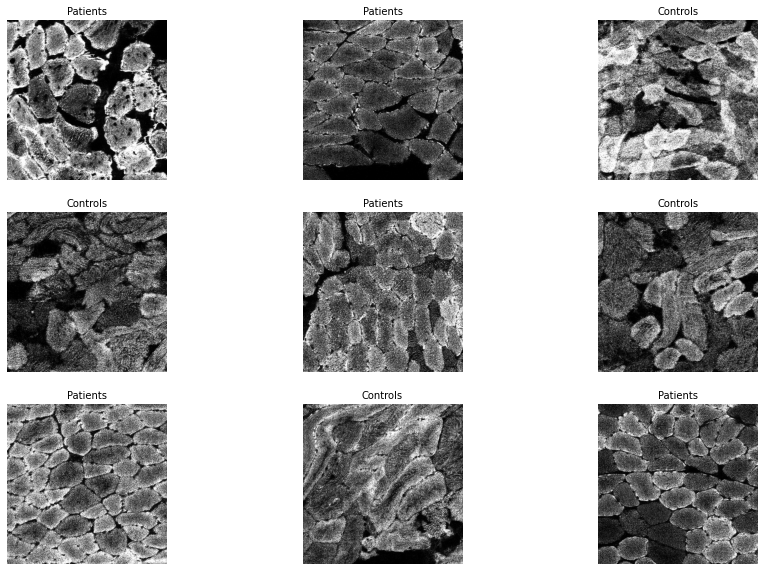

In [ ]:
def label_images2(DIR, dataset):
    label = []
    image = []
    j=0
    for i in range (0,10):
        j = random.randint(0, len(dataset.filenames))
        label.append(dataset.filenames[j].split('/')[0])
        image.append(DIR + '/' + dataset.filenames[j])
    return [label,image]

#plot the random images.
y,x = label_images2(train_dir, train_generator)
plt.figure(figsize=(15,10))
for i in range(0,9):
    X = load_img(x[i])
    plt.subplot(3,3,+1 + i)
    plt.axis(False)
    plt.title(y[i], fontsize=10)
    plt.imshow(X)
plt.show()

#**Building the model**
**Transfer Learning Using VGG16 and ResNet101v2**

In [ ]:
#instantiate a base model with pre-trained weights.VGG16
base_model=VGG16(include_top=False, weights="imagenet", input_shape=(224,224,3))

In [ ]:
# ResNet101v2 model
#base_model=ResNet101V2(include_top=False, weights="imagenet", input_shape=(224,224,3))

In [ ]:
#freeze the base model
base_model.trainable = False

In [ ]:
#Create new model on top
model=Sequential()
model.add(base_model)
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dense(2, activation='softmax'))

In [ ]:
optim=Adam(learning_rate=0.001)
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer=optim)
print("Model compilation completed.")

Model compilation completed.


In [ ]:
from keras.callbacks import ModelCheckpoint
checkpoint = ModelCheckpoint(monitor='val_accuracy',
                             verbose=1, 
                             save_best_only=True,
                             mode='min')

In [ ]:
callbacks = [EarlyStopping(monitor='val_accuracy',patience=30)]

In [ ]:
history=model.fit(train_generator,validation_data=val_generator,epochs=100,callbacks=callbacks)

Epoch 1/100
491/491 [==============================] - 23s 24ms/step - loss: 0.3336 - accuracy: 0.8676 - val_loss: 0.2383 - val_accuracy: 0.9091
Epoch 2/100
491/491 [==============================] - 11s 23ms/step - loss: 0.1976 - accuracy: 0.9318 - val_loss: 0.3289 - val_accuracy: 0.8727
Epoch 3/100
491/491 [==============================] - 11s 23ms/step - loss: 0.1487 - accuracy: 0.9430 - val_loss: 0.1040 - val_accuracy: 0.9545
Epoch 4/100
491/491 [==============================] - 11s 23ms/step - loss: 0.1105 - accuracy: 0.9572 - val_loss: 0.1299 - val_accuracy: 0.9364
Epoch 5/100
491/491 [==============================] - 11s 23ms/step - loss: 0.1014 - accuracy: 0.9674 - val_loss: 0.0516 - val_accuracy: 0.9909
Epoch 6/100
491/491 [==============================] - 12s 24ms/step - loss: 0.1018 - accuracy: 0.9633 - val_loss: 0.1556 - val_accuracy: 0.9273
Epoch 7/100
491/491 [==============================] - 11s 23ms/step - loss: 0.0952 - accuracy: 0.9664 - val_loss: 0.0969 - val_ac

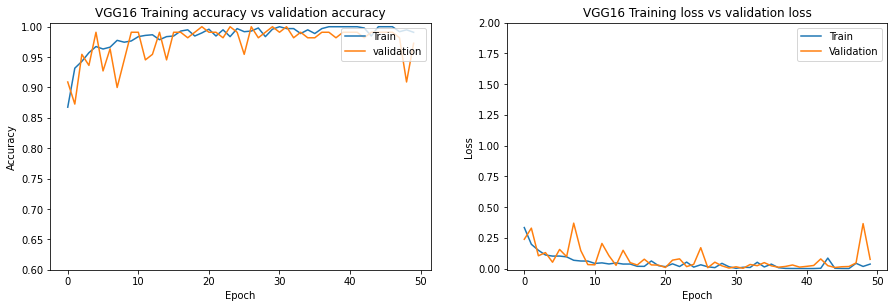

In [ ]:
# Plot training & validation accuracy values
plt.figure(1, figsize = (15,10)) 
plt.subplot(221) 
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('VGG16 Training accuracy vs validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.ylim((0.6))
plt.legend(['Train', 'validation'], loc='upper right')

# Plot training & validation loss values
plt.subplot(222) 
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('VGG16 Training loss vs validation loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim((-0.01,2))
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


In [ ]:
# Generate generalization metrics
score = model.evaluate(test_generator, verbose=0)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

Test loss: 0.4657845199108124 / Test accuracy: 0.9516128897666931


**Saving the model**

The saved full model file includes:

The model's architecture,The model's weight values

In [ ]:
model.save('/content/drive/MyDrive/Saliency_Maps_Single_Protein(TOM22)/VGG16_TOM22.h5')
print("saved the model")

saved the model


**Load the model**

In [ ]:
model_loaded = load_model("/content/drive/MyDrive/Saliency_Maps_Single_Protein(TOM22)/TOM22_SDHA.h5")

#**Saliency Maps:**

In [ ]:
def do_salience(image, model, label, prefix):
  '''
  Generates the saliency map of a given image.

  Args:
    image (file) -- picture that the model will classify
    model (keras Model) -- your Control and Patient classifier
    label (int) -- ground truth label of the image
    prefix (string) -- prefix to add to the filename of the saliency map
  '''
  #Creating a new path to store all normalized and super imposed images(Control SDHA Images)
  if label==1:
    newpath = r'/content/drive/MyDrive/Saliency_Maps_Single_Protein(TOM22)/Saliency_map_Images/Patients/'+a 
    if not os.path.exists(newpath):
        os.makedirs(newpath)
  else:
    #Creating a new path to store all normalized and super imposed images(Control SDHA Images)
    newpath = r'/content/drive/MyDrive/Saliency_Maps_Single_Protein(TOM22)/Saliency_map_Images/Controls/'+a 
    if not os.path.exists(newpath):
      os.makedirs(newpath)
  # Read the image and convert channel order from BGR to RG
  img = cv2.imread(image)
  cv2.imwrite(os.path.join(newpath , 'original.jpg'), img)
  #print(type(img))
  #print(a)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 

  # Resize the image to 244 x 244 and normalize pixel values to the range [0, 1]
  img = cv2.resize(img, (224, 224)) / 255.0

  # Add an additional dimension (for the batch), and save this in a new variable
  img2 = np.expand_dims(img, axis=0)

  # Declare the number of classes
  num_classes = 2

  # Define the expected output array by one-hot encoding the label
  expected_output = tf.one_hot([label] * img2.shape[0], num_classes)

  # Witin the GradientTape block:
  
  with tf.GradientTape() as tape:
    inputs = tf.cast(img2, tf.float32)
    tape.watch(inputs)
    predictions = model(inputs)
    loss = tf.keras.losses.categorical_crossentropy(
        expected_output, predictions
    )

  # get the gradients of the loss with respect to the model's input image
  gradients = tape.gradient(loss, inputs)
    
  # generate the grayscale tensor
  grayscale_tensor = tf.reduce_sum(tf.abs(gradients), axis=-1)

  # normalize the pixel values to be in the range [0, 255].
  
  normalized_tensor = tf.cast(
    255
    * (grayscale_tensor - tf.reduce_min(grayscale_tensor))
    / (tf.reduce_max(grayscale_tensor) - tf.reduce_min(grayscale_tensor)),
    tf.uint8
  )
    
  # Remove dimensions that are size 1
  normalized_tensor = tf.squeeze(normalized_tensor)
    
  # plot the normalized tensor

  plt.figure(figsize=(5, 5))
  plt.axis('off')
  plt.imshow(normalized_tensor, cmap='bone')
  plt.savefig(f"{newpath}/normalized_tensor.jpg")
  plt.show()

  # optional: superimpose the saliency map with the original image, then display it.
  gradient_color = cv2.applyColorMap(normalized_tensor.numpy(), cv2.COLORMAP_HOT)
  gradient_color = gradient_color / 255.0
  super_imposed = cv2.addWeighted(img, 0.5, gradient_color, 0.5, 0.0)

  # plot super imposed tensor
  plt.figure(figsize=(5, 5))
  plt.axis('off')
  plt.imshow(super_imposed, cmap='bone')
  plt.savefig(f"{newpath}/super_imposed_tensor.jpg")
  plt.show()

  # save the normalized tensor image to a file.
  salient_image_name = prefix + image
  normalized_tensor = tf.expand_dims(normalized_tensor, -1)
  normalized_tensor = tf.io.encode_jpeg(normalized_tensor, quality=100, format='grayscale')
  writer = tf.io.write_file(salient_image_name, normalized_tensor)

**For Patients:**

P07_image__32.jpg


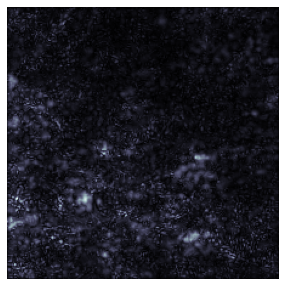

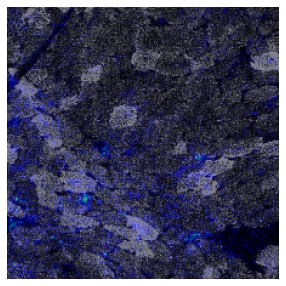

P06_image__00.jpg


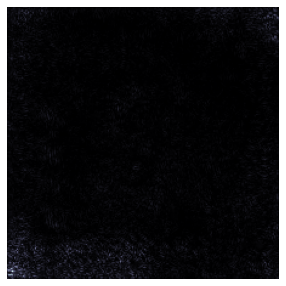

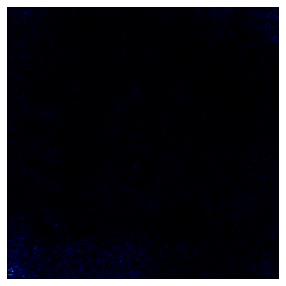

P05_image__92.jpg


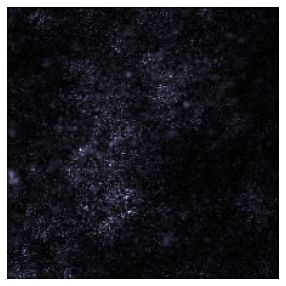

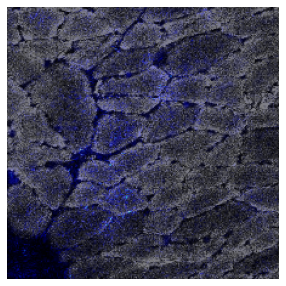

P06_image__32.jpg


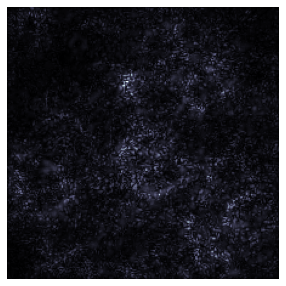

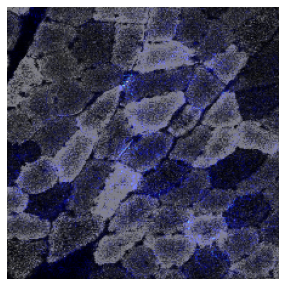

P09_image__412.jpg


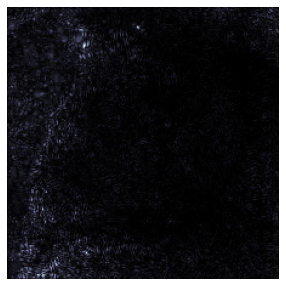

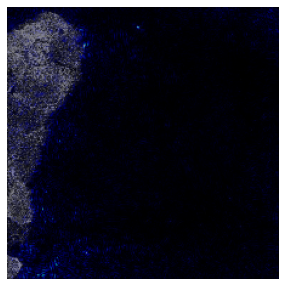

P02_image__74.jpg


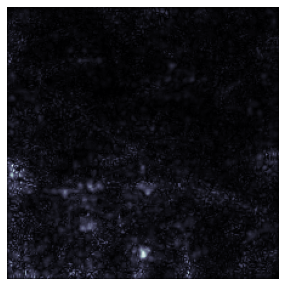

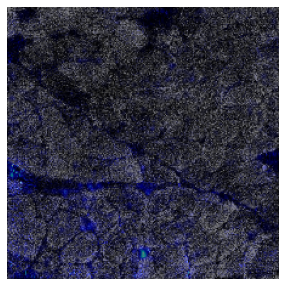

P09_image__76.jpg


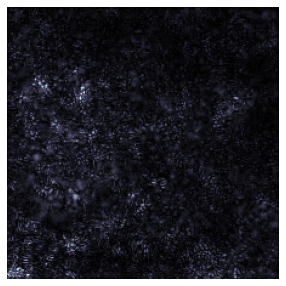

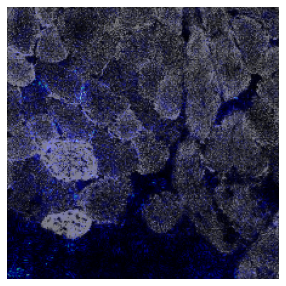

P06_image__34.jpg


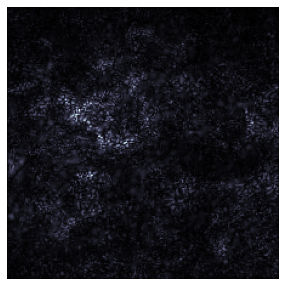

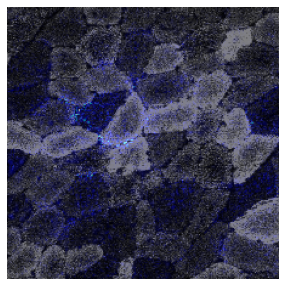

P09_image__412.jpg


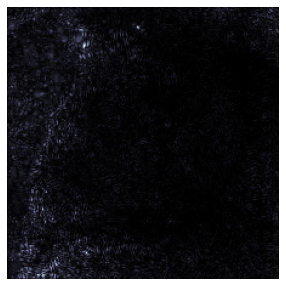

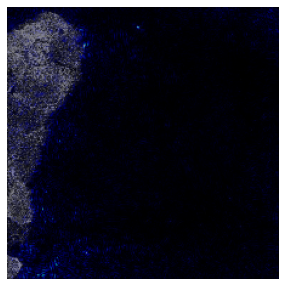

P02_image__39.jpg


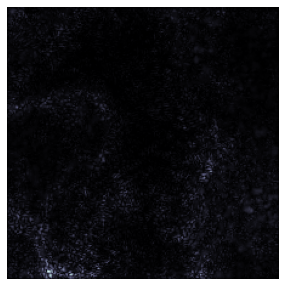

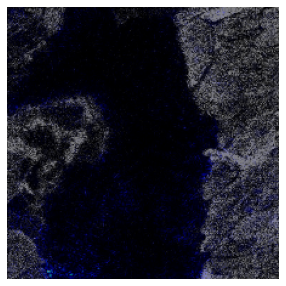

P09_image__48.jpg


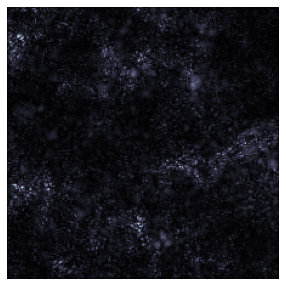

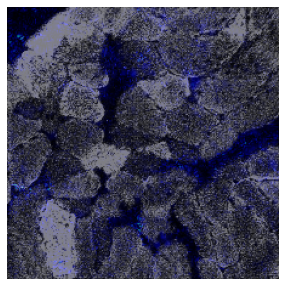

In [ ]:
files = os.listdir('/content/Second_Assumption/test/Patients/')
for i,img in enumerate(files):
  a = random.choice(files)
  print(a)
  do_salience('/content/Second_Assumption/test/Patients/'+a, model, 1, 'salient')
  if i == 10:
        break

**For Controls:**

C02_image__64.jpg


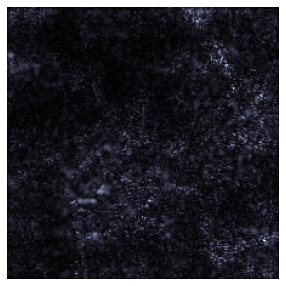

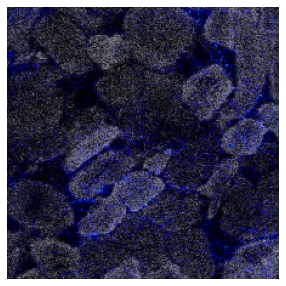

C02_image__38.jpg


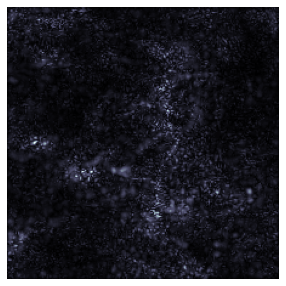

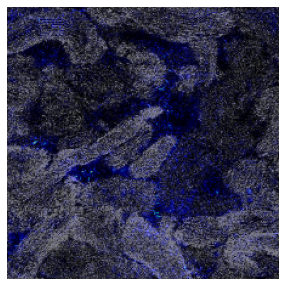

C04_image__32.jpg


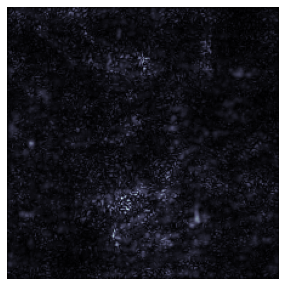

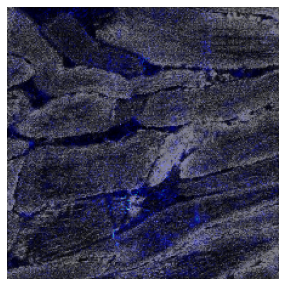

C02_image__913.jpg


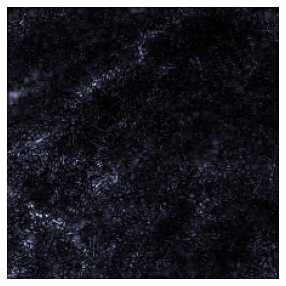

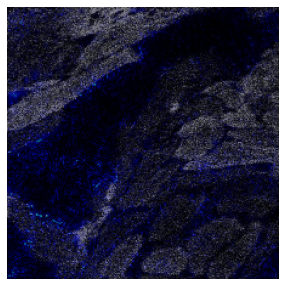

C02_image__715.jpg


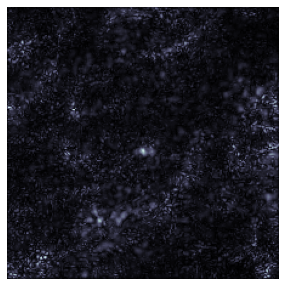

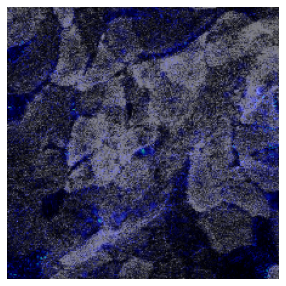

C04_image__62.jpg


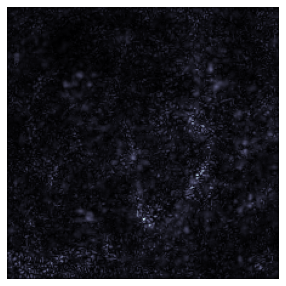

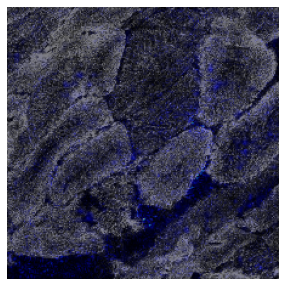

C04_image__62.jpg


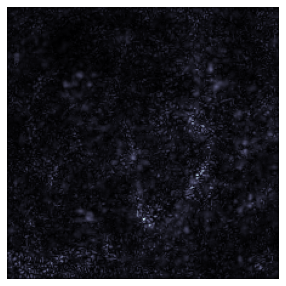

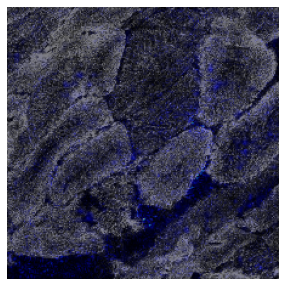

C02_image__04.jpg


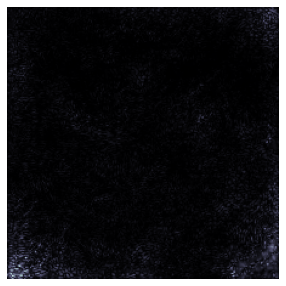

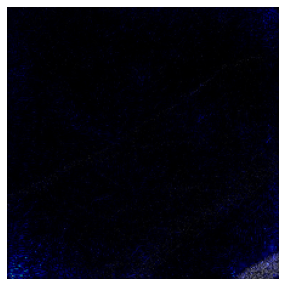

C01_image__09.jpg


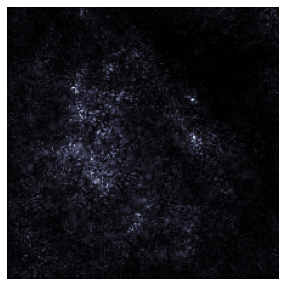

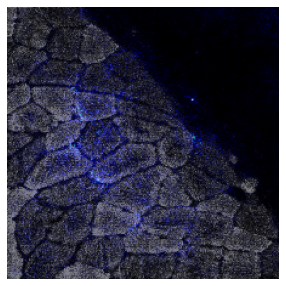

C02_image__89.jpg


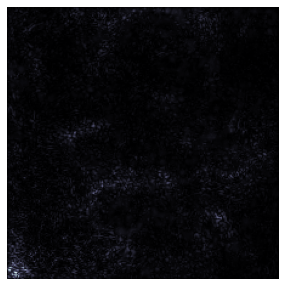

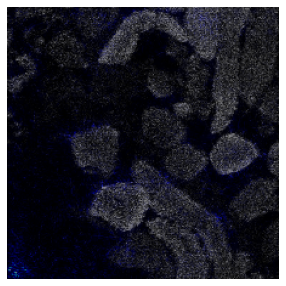

C02_image__42.jpg


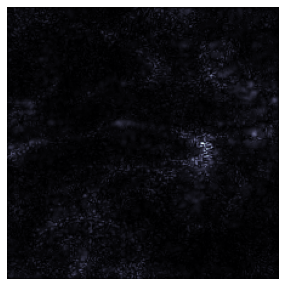

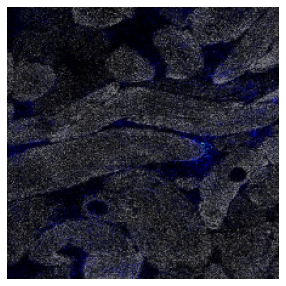

In [ ]:
files = os.listdir('/content/Second_Assumption/test/Controls/')
for i,img in enumerate(files):
  a = random.choice(files)
  print(a)
  do_salience('/content/Second_Assumption/test/Controls/'+a, model, 0, 'salient')
  if i == 10:
        break

#**Predictions**

In [ ]:
import math
seed=seed_num
n=len(test_generator.filenames)
n1=math.ceil(n/(1.0*2))
test_label=[]
for i in range(0,int(n1)):
  test_label.extend(np.array(test_generator[i][1]))

In [ ]:
test_label=np.argmax(test_label, axis=1)
#test_label


In [ ]:
yhat_prob=model.predict(test_generator,steps = len(test_generator))

In [ ]:
yhat_classes=np.argmax(yhat_prob,axis=1)
#print(yhat_classes)

In [ ]:
accuracy_ResNet=accuracy_score(test_label,yhat_classes)
print("Accuracy for the model: %f" % accuracy_ResNet)
precision_ResNet=precision_score(test_label,yhat_classes,average='weighted')
print("Precision for the model: %f" % precision_ResNet)
recall_ResNet=recall_score(test_label,yhat_classes,average='weighted')
print("Recall for the model: %f" % recall_ResNet)
f1_score_VGG16=f1_score(test_label,yhat_classes)
print("f1 score for the model: %f" % f1_score_VGG16)

Accuracy for the model: 0.951613
Precision for the model: 0.951083
Recall for the model: 0.951613
f1 score for the model: 0.968750


Confusion Matrix

In [ ]:
confusion_VGG16=confusion_matrix(test_label,yhat_classes)
confusion_VGG16

array([[25,  4],
       [ 2, 93]])

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_mat = confusion_matrix(test_label, yhat_classes>0.5)

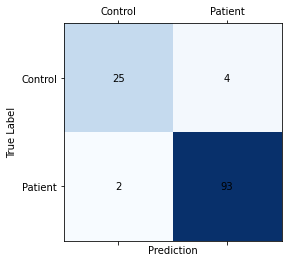

<Figure size 1080x720 with 0 Axes>

In [ ]:
fig, ax = plt.subplots()

ax.matshow(confusion_mat, cmap=plt.cm.Blues)

ax.set_xlabel('Prediction')
ax.set_ylabel('True Label')

tick_labels = ['Control', 'Patient']

ax.set_xticks(range(len(tick_labels)))
ax.set_yticks(range(len(tick_labels)))
ax.set_xticklabels(tick_labels)
ax.set_yticklabels(tick_labels)

for i in range(len(tick_labels)):
    for j in range(len(tick_labels)):
        ax.text(j, i, confusion_mat[i, j],
               ha='center', va='center')
        
plt.figure(figsize=(15,10))
plt.show()

**Reloading with the load_model function:**

In [ ]:
# Generate generalization metrics
score = model_loaded.evaluate(test_generator, verbose=0)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

**Prediction**

In [ ]:
dirs = test_generator.class_indices
rdirs = {v:k  for k,v in dirs.items()}

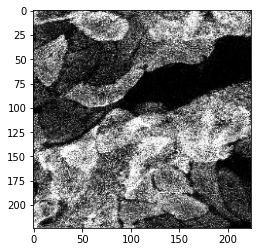

predict: Patients actual: Controls


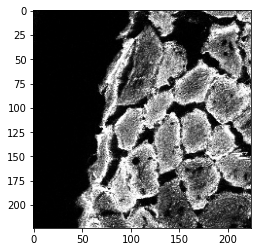

predict: Patients actual: Patients


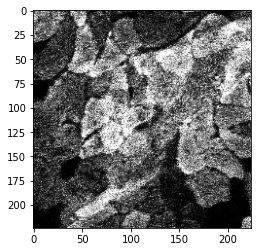

predict: Controls actual: Controls


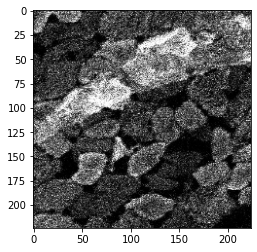

predict: Patients actual: Controls


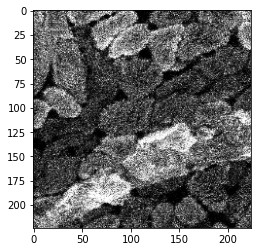

predict: Patients actual: Controls


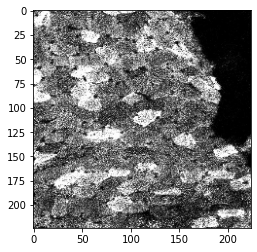

predict: Patients actual: Patients


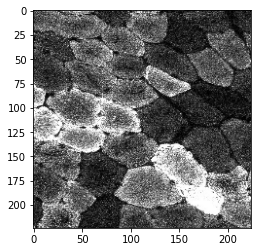

predict: Patients actual: Patients


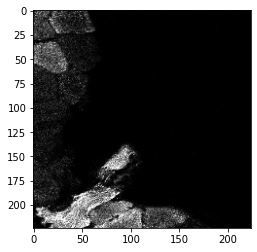

predict: Patients actual: Patients


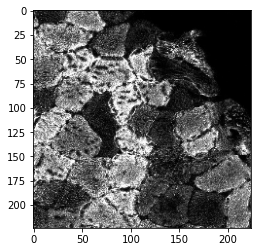

predict: Patients actual: Patients


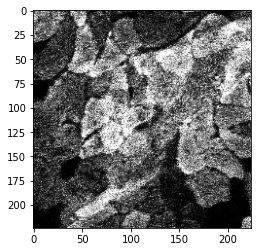

predict: Controls actual: Controls


In [ ]:

for i in range(10):
    choice = random.randint(0,1)
    dir = rdirs[choice]
    files = os.listdir(test_dir+'/'+dir)
    img = random.choice(files)
    a = cv2.imread(test_dir+'/'+dir+'/'+img)  
    a = cv2.resize(a,(224,224))
    plt.imshow(a)
    plt.show()
    #plt.imshow(img)
    a = np.array(a/255)
    answer = model.predict(np.array([a]))
    pred = np.argmax(answer)
    print("predict:",rdirs[pred],"actual:",rdirs[choice])
    #do_salience(test_dir+'/'+dir+'/'+img, model_loaded, 1, 'salient')

**Single image saliency map controls and patients **

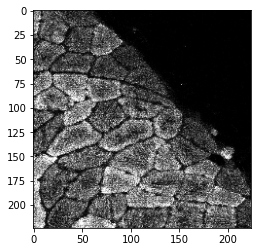

predict: Patients actual: Controls


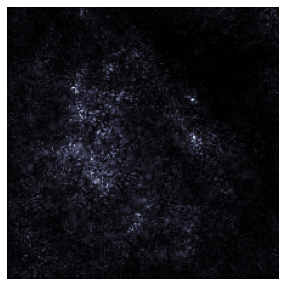

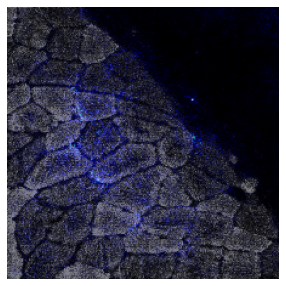

In [ ]:
dir= os.listdir('/content/Second_Assumption/test/Controls/')
a='C01_image__09.jpg'
img=cv2.imread('/content/Second_Assumption/test/Controls/'+a)
img = cv2.resize(img,(224,224))
plt.imshow(img)
plt.show()
a = np.array(img/255)
answer = model.predict(np.array([img]))
pred = np.argmax(answer)
print("predict:",rdirs[pred],"actual:",rdirs[choice])

dir= os.listdir('/content/Second_Assumption/test/Controls/')
a='C01_image__09.jpg'
do_salience('/content/Second_Assumption/test/Controls/'+a, model, 0, 'salient')


In [ ]:
dir= os.listdir('/content/Second_Assumption/test/Patients/')
a='P01_image__06.jpg'
img=cv2.imread('/content/Second_Assumption/test/Patients/'+a)
img = cv2.resize(img,(224,224))
plt.imshow(img)
plt.show()
a = np.array(img/255)
answer = model.predict(np.array([img]))
pred = np.argmax(answer)
print("predict:",rdirs[pred],"actual:",rdirs[choice])

dir= os.listdir('/content/Second_Assumption/test/Patients/')
a='P01_image__06.jpg'
do_salience('/content/Second_Assumption/test/Patients/'+a, model, 0, 'salient')